# Analyzing Typing Efficiency for a given Keyboard Layout
    - By Siva Sundar, EE23B151
In this notebook, I made a python code which analyzes typing efficiency using a given keyboard layout by calculating the distance traveled during typing based on assumed key presses. We define the QWERTY layout first, which includes both regular and special keys, along with their respective coordinates. We then simulate a typing scenario using a string (user input) to generate a list of key presses, applying touch typing principles.

The key presses are then analyzed to compute their frequency, and a mapping is created to bind each key to its nearest home key. We calculate the total distance traveled for the key presses, considering the frequency of each key and its binding to the home row.

Finally, we display a table of key frequencies, their corresponding bindings, and the contributions to the total distance traveled. Additionally, we visualize the keyboard layout using a Voronoi diagram overlayed with a heatmap that represents key press frequencies, highlighting which keys are most often used during typing.

In [1]:
import matplotlib.pyplot as plt
import math
from scipy.spatial import Voronoi, voronoi_plot_2d

Defining our keyboard layouts (QWERTY, Dvorak and Colemak) which are assumed to be in another python file in the same directory as this notebook. They should contain two dictionaries `keys` and `characters`.

In [2]:
import qwerty_layout as l
import dvorak_layout as m
import colemak_layout as n

We define the functions which will be used for specific steps. Documentation is given for each function in its definition.

In [3]:
def get_points_labels(layout):
    """Used to key the (x,y) coordinates of ALL keys in the layout,
    including their labels (Key names)."""

    keys = layout.keys
    chars = layout.characters

    points = []
    labels = []

    for key in chars:
        if key not in keys and key != " ":
            _, lower = chars[key]
            lower_loc = keys[lower]["pos"]
            points.append(lower_loc)
            labels.append([lower, key])

    for key in keys:
        if key not in sum(labels, []):
            key_loc = keys[key]["pos"]
            points.append(key_loc)
            labels.append([key, None])

    return points, labels


def key_count(key_press):
    """Returns the frequency dictionary with key-value pairs as key label and its frequency"""
    key_freq = {}
    for key in key_press:
        if key not in key_freq:
            key_freq[key] = 1
        else:
            key_freq[key] += 1
    return key_freq


def find_key_press(string, layout):
    """Used to find the key presses involved while typing the string, given a layout is followed."""
    key_press = []
    key_press_loc = []
    keys = layout.keys
    chars = layout.characters

    for letter in string:
        if (
            letter in chars and letter not in keys and letter != " "
        ):  # The key needs shift
            shift, lower_key = chars[letter]

            shift_pos = keys[shift]["pos"]
            lower_pos = keys[lower_key]["pos"]

            key_press += [shift, lower_key]
            key_press_loc += [shift_pos, lower_pos]

        elif letter == " ":
            space = chars[letter][0]
            space_pos = keys[space]["pos"]
            key_press += [space]
            key_press_loc += [space_pos]

        else:
            try:
                pos = keys[letter]["pos"]
            except KeyError:
                raise KeyError(f"The letter '{letter}' is not in layout")
            key_press += [letter]
            key_press_loc += [pos]

    return key_press, key_press_loc


def plotter(key_freq, layout, ax):
    """Function which handles plotting the keyboard (made using Voronoi diagram)
    as well as the heatmap over the keyboard."""

    # Get key locations and labels for Voronoi
    points, labels = get_points_labels(layout)

    # Compute Voronoi diagram
    vor = Voronoi(points)

    # Plot Voronoi diagram
    voronoi_plot_2d(
        vor,
        ax=ax,
        show_vertices=False,
        line_colors="orange",
        line_width=2,
        line_alpha=0.6,
        point_size=0,
    )

    # Now we'll color the Voronoi cells based on frequency
    key_colors = coloring(key_freq)

    # Plot frequency circles as an overlay on the Voronoi diagram
    for key in key_freq:
        x, y = layout.keys[key]["pos"]
        key_color = key_colors[key]

        # Draw frequency-based circles on the Voronoi diagram
        circle = plt.Circle(
            (x, y),
            radius=0.5,
            alpha=key_color[1],
            edgecolor=key_color[0],
            facecolor=key_color[0],
            linewidth=5,
        )
        ax.add_artist(circle)

    # Represent each key with its label
    for i, point in enumerate(points):
        if labels[i][1] != None:
            ax.text(
                point[0],
                point[1] + 0.25,
                labels[i][1],
                fontsize=10,
                ha="center",
                va="center",
                color="black",
            )
            ax.text(
                point[0],
                point[1] - 0.25,
                labels[i][0],
                fontsize=10,
                ha="center",
                va="center",
                color="black",
            )
        else:
            ax.text(
                point[0],
                point[1],
                labels[i][0],
                fontsize=10,
                ha="center",
                va="center",
                color="black",
            )

    # Set limits for the axes
    ax.set_xlim(-1, 14)
    ax.set_ylim(-1, 5)
    # ax.invert_yaxis()  # Invert Y axis to match keyboard layout

    # Set labels and title
    ax.set_title("Voronoi Diagram and Key Frequency Heatmap")
    ax.set_xlabel("X Axis")
    ax.set_ylabel("Y Axis")


def coloring(key_freq):
    """Function returns a 'key_color' list, which contains the color of the heatmap
    at the location of a key. It is calculated w.r.t frequency. The highest frequency
    corresponds to Red color, and least corresponds to Blue color.
    The ratio of frequency of a key to max frequency is used for making the heatmap
    transparent in that region."""

    # List of colors
    color = ["r", "y", "g", "b"]

    # Initializing key_color list (contains [color_name, transparency_amount])
    key_color = {}

    # Finding max frequency
    max_freq = max(key_freq.values())

    # Iterating through all the keys' frequencies
    for key in key_freq:
        alpha = key_freq[key] / max_freq  # Ratio of freq of key to max freq
        if alpha >= 1:
            key_color[key] = [color[0], alpha / 2]
        elif alpha < 1 and alpha >= 0.6:
            key_color[key] = [color[1], alpha / 2]
        elif alpha < 0.6 and alpha >= 0.2:
            key_color[key] = [color[2], alpha / 2]
        elif alpha < 0.2:
            key_color[key] = [color[3], alpha / 2]

    return key_color


def print_table(key_freq, layout):
    """Function to display a table with rows as 'keys' and columns as 'Key name', its 'frequency',
    its 'binded home key', 'home key's location', the 'key's location' and the
    'contribution' of the key to total distance.
    The rows are sorted in descending order of frequency, ie, first row corresponds to key
    with max frequency and last row corresponds to least frequency."""

    # Column heading
    header = [
        "Key  ",
        "Frequency ",
        "Binded Home Key",
        "Home Key Coord.  ",
        "Key Coord.  ",
        "Freq x Dist",
    ]

    # Providing a spacing format
    format_row = "{:>8} {:>10} {:>15} {:>20} {:>15} {:>18}"

    # Print the header row with underline
    print(format_row.format(*header))
    print(
        "─" * 8
        + " "
        + "─" * 10
        + " "
        + "─" * 15
        + " "
        + "─" * 20
        + " "
        + "─" * 15
        + " "
        + "─" * 18
    )

    # Sort the key_freq dictionary by frequency in descending order
    sorted_key_freq = sorted(key_freq.items(), key=lambda x: x[1], reverse=True)

    total_dist = 0
    # Iterate over the sorted key_freq dictionary and print each key with its frequency
    for key, freq in sorted_key_freq:
        key_pos, home_key = layout.keys[key]["pos"], layout.keys[key]["start"]
        home_pos = layout.keys[home_key]["pos"]
        key_dist = freq * math.dist(key_pos, home_pos)

        # Print each row
        total_dist += key_dist
        print(
            format_row.format(
                key, freq, home_key, f"{home_pos}", f"{key_pos}", f"{key_dist:.2f}"
            )
        )

    # Print a separator line
    print(
        "─" * 8
        + "─"
        + "─" * 10
        + "─"
        + "─" * 15
        + "─"
        + "─" * 20
        + "─"
        + "─" * 15
        + "─"
        + "─" * 18
    )

    # Print total distance, aligning it with the last column
    total_dist_str = f"Total Distance = {total_dist:.2f}"
    total_dist_spacing = len(format_row.format("", "", "", "", "", "")) - len(
        total_dist_str
    )
    print(" " * total_dist_spacing + total_dist_str)

Main program which uses all the above functions to give the output: a table which contains all the contributions of each key to the total distance, and the **heatmap** for the keypresses.

   Key   Frequency  Binded Home Key    Home Key Coord.      Key Coord.          Freq x Dist
──────── ────────── ─────────────── ──────────────────── ─────────────── ──────────────────
   Space         12               t            (4.75, 2)          (5, 0)              24.19
       e          7               e            (8.75, 2)       (8.75, 2)               0.00
       o          5               o           (10.75, 2)      (10.75, 2)               0.00
       a          5               a            (1.75, 2)       (1.75, 2)               0.00
       h          4               n            (7.75, 2)       (6.75, 2)               4.00
       l          4               n            (7.75, 2)        (7.5, 3)               4.12
       r          4               r            (2.75, 2)       (2.75, 2)               0.00
       d          3               t            (4.75, 2)       (5.75, 2)               3.00
       ,          3               e            (8.75, 2)       (9.25, 1)        

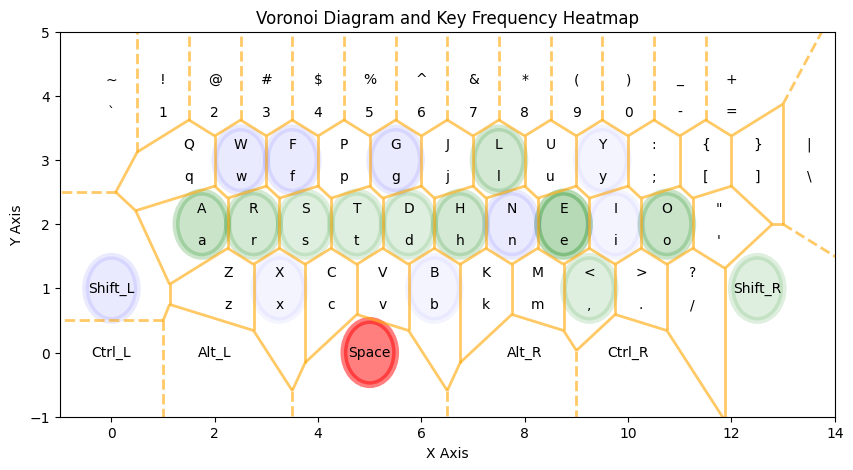

In [4]:
# Main program
fig, ax = plt.subplots(figsize=(10, 5))

string = input("\nEnter string: ")
layout = n
key_press, key_press_loc = find_key_press(string, layout)
key_freq = key_count(key_press)
print_table(key_freq, layout)
plotter(key_freq, layout, ax)

plt.show()
plt.close(fig)

# BONUS 1: Different layouts

Here, the outputs (both table and heatmap) are printed for different keyboard layouts.

In [5]:
layouts = [l, m, n]
layout_names = ["QWERTY", "DVORAK", "COLEMAK"]

Run the below code which asks for string input and prints the output for all three keyboard layouts.

Table for QWERTY
   Key   Frequency  Binded Home Key    Home Key Coord.      Key Coord.          Freq x Dist
──────── ────────── ─────────────── ──────────────────── ─────────────── ──────────────────
   Space         14               f            (4.75, 2)          (5, 0)              28.22
       h         13               j            (7.75, 2)       (6.75, 2)              13.00
       f         12               f            (4.75, 2)       (4.75, 2)               0.00
       i          9               k            (8.75, 2)        (8.5, 3)               9.28
       u          8               j            (7.75, 2)        (7.5, 3)               8.25
       g          7               f            (4.75, 2)       (5.75, 2)               7.00
       w          7               s            (2.75, 2)        (2.5, 3)               7.22
       s          6               s            (2.75, 2)       (2.75, 2)               0.00
       d          6               d            (3.75, 2)       

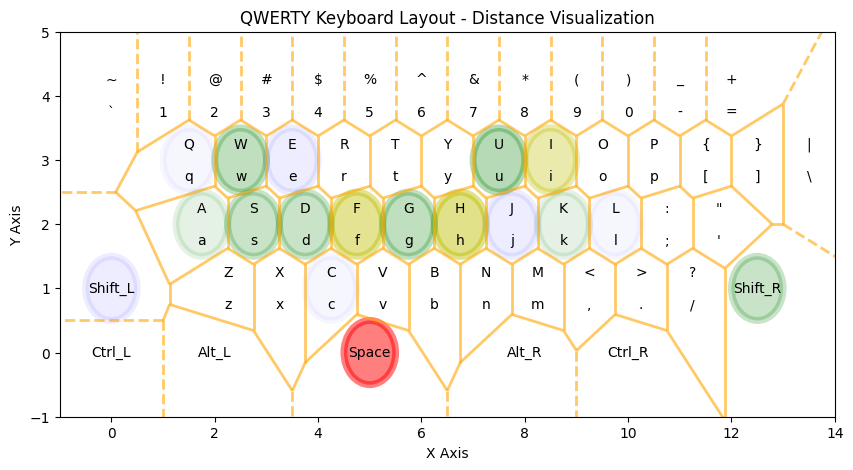

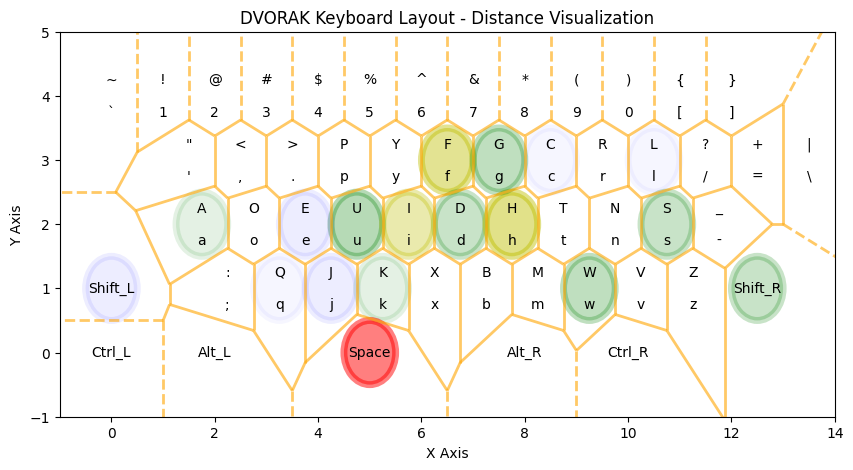

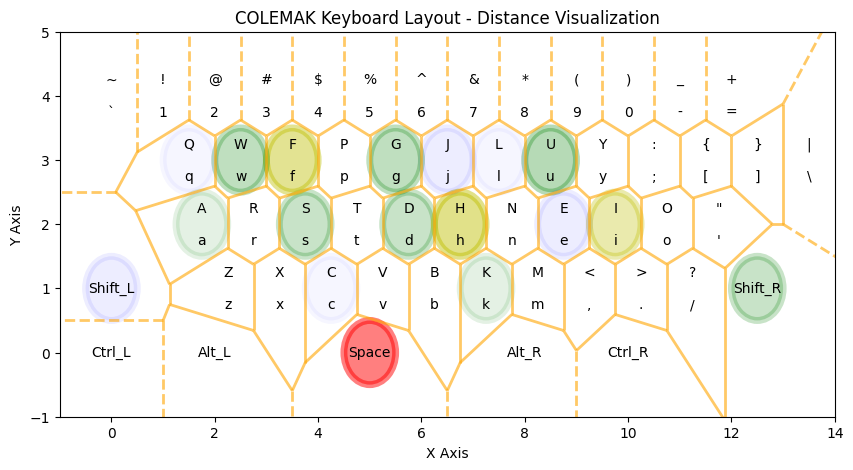

In [6]:
# Main program
string = input("Enter string: ")

X = []
Y = []
F = []
for i in range(len(layouts)):
    fig, ax = plt.subplots(figsize=(10, 5))

    layout = layouts[i]
    key_press, key_press_loc = find_key_press(string, layout)
    key_freq = key_count(key_press)
    plotter(key_freq, layout, ax)
    plt.title(f"{layout_names[i]} Keyboard Layout - Distance Visualization")
    print(f"Table for {layout_names[i]}")
    print_table(key_freq, layout)

# BONUS 2: Animation with a better heatmap style

Here, we visualize the key presses using animation. I also changed the style of how the heatmap is shown. The string input is sliced using no. of frames till now, and plotted per frame. Another input asks for which layout is to be chosen, 0: QWERTY, 1: Dvorak, 2: Colemak

In [7]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import numpy as np
from matplotlib.colors import Normalize, LinearSegmentedColormap

Modified plotter function for better heatmap.

In [8]:
def plotter_modified(key_press, key_freq, key_press_loc, layout, ax):
    """Function which handles plotting the keyboard (made using Voronoi diagram)
    as well as the heatmap over the keyboard."""

    # Get key locations and labels for Voronoi
    points, labels = get_points_labels(layout)

    # Compute Voronoi diagram
    vor = Voronoi(points)

    # Plot Voronoi diagram
    voronoi_plot_2d(
        vor,
        ax=ax,
        show_vertices=False,
        line_colors="black",
        line_width=2,
        line_alpha=0.6,
        point_size=0,
    )

    # Generate the space in which the blobs will live
    xmin, xmax, ymin, ymax = (-1, 15, -1, 15)
    n_bins = 1000
    xx = np.linspace(xmin, xmax, n_bins)
    yy = np.linspace(ymin, ymax, n_bins)

    # Generate the blobs. The range of the values is roughly -.0002 to .0002
    var = 0.2

    # Storing weights
    weights = np.zeros((n_bins, n_bins))
    for i in range(len(key_press)):
        key = key_press[i]
        x, y = key_press_loc[i]
        freq = key_freq[key]

        gauss_keys_x = normal_pdf(xx, x, var)
        gauss_keys_y = normal_pdf(yy, y, var)
        weights += freq * (np.outer(gauss_keys_y, gauss_keys_x))

    # Making my own color map
    colors = [
        (0.0, "white"),
        (0.2, "dodgerblue"),
        (0.5, "cyan"),
        (0.6, "greenyellow"),
        (0.7, "yellow"),
        (1, "coral"),
    ]
    cmap = LinearSegmentedColormap.from_list("custom_cmap", colors)

    vmax = np.abs(weights).max()
    imshow_kwargs = {
        "vmax": vmax,
        "vmin": 0,
        "cmap": cmap,
        "extent": (xmin, xmax, ymin, ymax),
        "origin": "lower",
    }

    # Create an alpha channel based on weight values
    # Any value whose absolute value is > .0001 will have zero transparency
    alphas = Normalize(0, 0.3, clip=True)(np.abs(weights))
    alphas = np.clip(alphas, 0.4, 1)  # alpha value clipped at the bottom at .4

    # Create the figure and image
    ax.imshow(weights, alpha=alphas, **imshow_kwargs)

    # Represent each key with its label
    for i, point in enumerate(points):
        if labels[i][1] != None:
            ax.text(
                point[0],
                point[1] + 0.25,
                labels[i][1],
                fontsize=10,
                ha="center",
                va="center",
                color="black",
            )
            ax.text(
                point[0],
                point[1] - 0.25,
                labels[i][0],
                fontsize=10,
                ha="center",
                va="center",
                color="black",
            )
        else:
            ax.text(
                point[0],
                point[1],
                labels[i][0],
                fontsize=10,
                ha="center",
                va="center",
                color="black",
            )

    # Set limits for the axes
    ax.set_xlim(-1, 14)
    ax.set_ylim(-1, 5)
    # ax.invert_yaxis()  # Invert Y axis to match keyboard layout

    # Set labels and title
    plt.title("Voronoi Diagram and Key Frequency Heatmap")
    plt.xlabel("X Axis")
    plt.ylabel("Y Axis")


def normal_pdf(x, mean, var):
    return np.exp(-((x - mean) ** 2) / (2 * var))

Functions which are used for initializing and updating the plot for animation.

In [9]:
ln = ax.figure


def init():
    ax.set_xlim(-1, 14)
    ax.set_ylim(-1, 5)
    return (ln,)


def update(frame, layout, layout_name, string, ax):
    ax.clear()
    slice_to_process = string[:frame]
    key_press, key_press_loc = find_key_press(slice_to_process, layout)
    key_freq = key_count(key_press)
    plotter_modified(key_press, key_freq, key_press_loc, layout, ax)

    # Set the title for each subplot
    ax.set_title(f"{layout_name} Keyboard Layout - Distance Visualization", fontsize=16)

    # Update the data in the line object (instead of creating a new plot)
    ln = ax.figure
    return (ln,)

Main program which asks for string input and keyboard layout.

   Key   Frequency  Binded Home Key    Home Key Coord.      Key Coord.          Freq x Dist
──────── ────────── ─────────────── ──────────────────── ─────────────── ──────────────────
   Space         11               t            (4.75, 2)          (5, 0)              22.17
       h          9               n            (7.75, 2)       (6.75, 2)               9.00
       d          8               t            (4.75, 2)       (5.75, 2)               8.00
 Shift_L          6               a            (1.75, 2)          (0, 1)              12.09
       e          6               e            (8.75, 2)       (8.75, 2)               0.00
       a          6               a            (1.75, 2)       (1.75, 2)               0.00
       s          6               s            (3.75, 2)       (3.75, 2)               0.00
       t          5               t            (4.75, 2)       (4.75, 2)               0.00
 Shift_R          5               o           (10.75, 2)       (12.5, 1)        

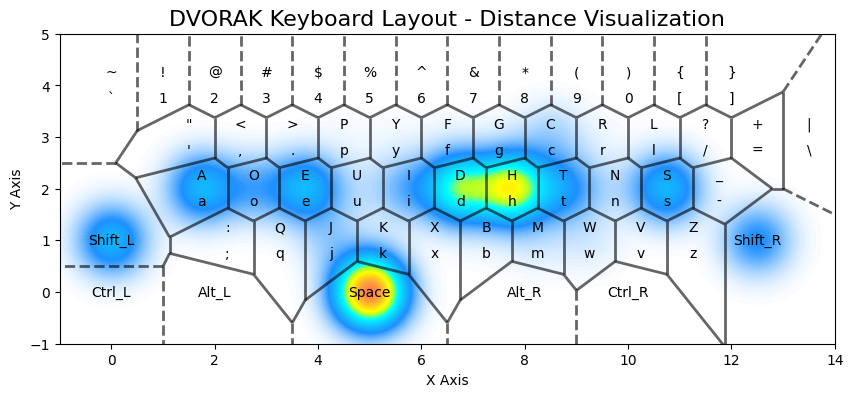

In [10]:
# Create figure and axis for animation
fig, ax = plt.subplots(figsize=(10, 5))

# Asking input string
string = input("Enter a string: ")
# Asking keyboard layout
layout_index = int(input("Enter 0: QWERTY, 1: DVORAK, 2:COLEMAK = "))

# Finding the total frames = length of string
num_frames = len(string)

# Animation function
ani = FuncAnimation(
    fig,
    update,
    frames=np.arange(1, num_frames + 1),
    interval=150,
    fargs=(layouts[layout_index], layout_names[layout_index], string, ax),
    init_func=init,
    blit=True,
)

# To check the frequency of keys
key_press, key_press_loc = find_key_press(string, layout)
key_freq = key_count(key_press)
print_table(key_freq, layout)

# Creating the animation video
HTML(ani.to_jshtml())

# Save the animation as an MP4 file
# ani.save(filename="pillow_example.gif", writer="pillow")